In [35]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler



import plotly.graph_objects as go
import matplotlib
matplotlib.use('agg')

In [3]:
series = pd.read_csv(
    "../assets/datasets/time_series_solar.csv",
    parse_dates=["Datetime"],
    index_col="Datetime",
)["Incoming Solar"]
series.tail()

Datetime
2013-09-30 19:00:00    0.0
2013-09-30 20:00:00    0.0
2013-09-30 21:00:00    0.0
2013-09-30 22:00:00    0.0
2013-09-30 23:00:00    0.0
Name: Incoming Solar, dtype: float64

In [7]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=series.index, y=series, name="Incoming Solar"))
fig.show()

In [10]:
# Naive forecast
shifted = series.shift(1)

In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=series.index, y=series, name="Incoming Solar"))
fig.add_trace(go.Scatter(x=shifted.index, y=shifted, name="shifted"))
fig.show()

In [24]:
expanded = series.expanding().mean()

In [25]:
# Seasonal naive forecast
m = 12  # Replace 'm' with the length of your season
m_shifted = series.shift(m)

fig = go.Figure()
fig.add_trace(go.Scatter(x=series.index, y=series, name="Incoming Solar"))
# fig.add_trace(go.Scatter(x=shifted.index, y=shifted, name="shifted"))
fig.add_trace(go.Scatter(x=m_shifted.index, y=m_shifted, name="m_shifted"))
fig.add_trace(go.Scatter(x=expanded.index, y=expanded, name="expanded"))
fig.show()

In [31]:
series_daily = series.resample("D").sum()
nlags=365

acf_scores = acf(x=series_daily, nlags=nlags)
pacf_scores = pacf(x=series_daily, nlags=nlags)

print(acf_scores, pacf_scores)


[ 1.          0.80245259  0.73951048  0.71476338  0.71014496  0.70911541
  0.69763394  0.69081867  0.70036071  0.69530016  0.69132118  0.68254022
  0.68079506  0.67698138  0.67617088  0.66548102  0.64926678  0.64978731
  0.64706942  0.65525346  0.64995276  0.64947903  0.6357826   0.62896167
  0.61486706  0.60634731  0.60294298  0.6113752   0.60706751  0.60617894
  0.60809509  0.60798511  0.58554053  0.57731958  0.56928682  0.56729661
  0.55739923  0.5504451   0.54966513  0.53571833  0.52189102  0.52098575
  0.50806018  0.50455987  0.495752    0.48450791  0.47069812  0.46096199
  0.45381829  0.44158178  0.43794714  0.43481837  0.41863689  0.41021504
  0.39647828  0.38058708  0.3739532   0.36873437  0.3760406   0.36532419
  0.34610612  0.33769082  0.32538688  0.32432762  0.31332248  0.30233734
  0.29432866  0.28636578  0.28050776  0.26517913  0.25169024  0.23583396
  0.22141421  0.21339679  0.18890181  0.17966068  0.17770397  0.16266918
  0.15174694  0.14009039  0.13412442  0.12648149  0

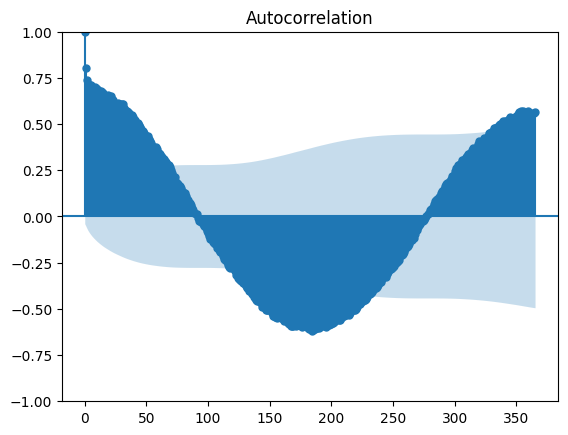

In [36]:
fig = plot_acf(series_daily, lags=nlags)
display(fig)

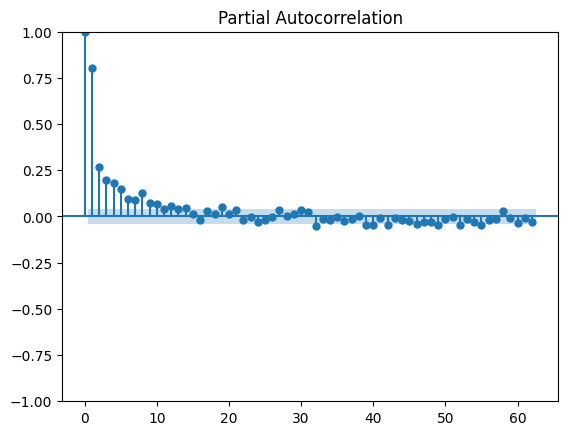

In [38]:

pacf_plot_ = plot_pacf(series_daily, lags=62)
display(pacf_plot_)


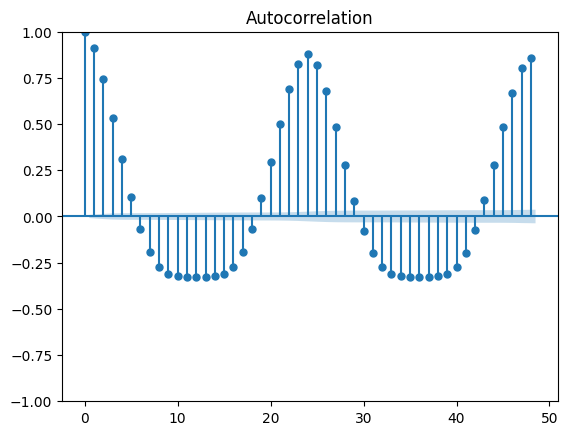

In [39]:
fig = plot_acf(series, lags=48)
display(fig)

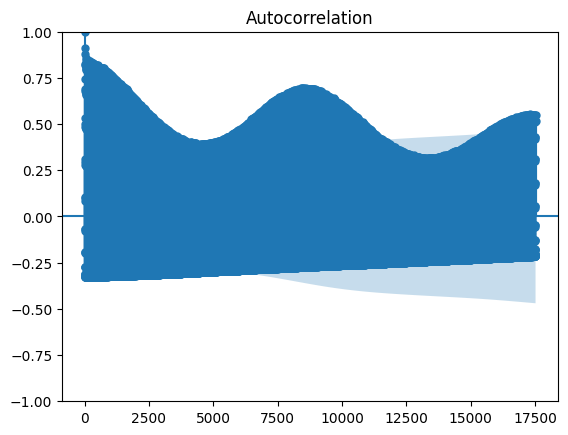

In [40]:
fig = plot_acf(series, lags=365 * 24 * 2)
display(fig)

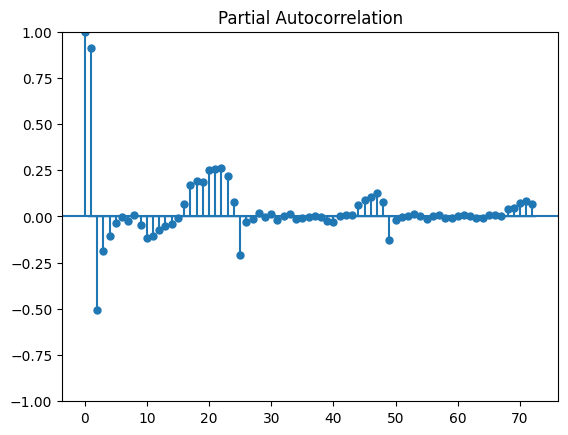

In [41]:

fig = plot_pacf(series, lags=72)
display(fig)

In [44]:
model = ARIMA(series, order=(1, 1, 1), freq="H")
model_fit = model.fit()

# make prediction
yhat = model_fit.predict(start=0, end=24, typ="levels")
print(yhat)

/home/volody/code/study-py/ts-pytorch/.venv/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



2007-10-01 00:00:00      0.000000
2007-10-01 01:00:00      0.000000
2007-10-01 02:00:00      0.000000
2007-10-01 03:00:00      0.000000
2007-10-01 04:00:00      0.000000
2007-10-01 05:00:00      0.000000
2007-10-01 06:00:00      0.000000
2007-10-01 07:00:00      0.000000
2007-10-01 08:00:00      1.424502
2007-10-01 09:00:00     25.960467
2007-10-01 10:00:00     43.130824
2007-10-01 11:00:00     76.432774
2007-10-01 12:00:00    115.454998
2007-10-01 13:00:00    207.578217
2007-10-01 14:00:00    153.321723
2007-10-01 15:00:00    425.222308
2007-10-01 16:00:00    328.934848
2007-10-01 17:00:00     23.182567
2007-10-01 18:00:00    -12.877353
2007-10-01 19:00:00     -0.357798
2007-10-01 20:00:00     -5.467186
2007-10-01 21:00:00     -0.407988
2007-10-01 22:00:00     -0.030446
2007-10-01 23:00:00     -0.002272
2007-10-02 00:00:00     -0.000170
Freq: H, Name: predicted_mean, dtype: float64


In [43]:
model = ARIMA(series_daily, order=(1, 1, 1), freq="D")
model_fit = model.fit()

# make prediction
yhat = model_fit.predict(start=0, end=5, typ="levels")
print(yhat)

Datetime
2007-10-01       0.000000
2007-10-02    1069.933623
2007-10-03    2705.386804
2007-10-04    2555.254866
2007-10-05    2228.324271
2007-10-06    1810.648346
Freq: D, Name: predicted_mean, dtype: float64
